# Scraper

In [1]:
import sys
import urllib.request
from urllib.request import Request, urlopen
from urllib.request import URLError, HTTPError
from urllib.parse import quote
import http.client
from http.client import IncompleteRead, BadStatusLine
http.client._MAXHEADERS = 1000

import time
import os
import ssl
import datetime
import json
import socket
from fake_useragent import UserAgent
import chromedriver_binary
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import webdrivermanager
from keras import applications

Using TensorFlow backend.


In [2]:
class image_download:
    """
    Class based on google-images-download module created by hardikvasa.
    I applied few changes and remove unnecessary methods to make class smaller,
    more suitable for my needs and supported with documentation.
    """
    def __init__(self, arguments):
        self.arguments = arguments
        pass

    # Downloading entire Web Document (Raw Page Content)
    def download_page(self,url):
        """
        Method downloading page as raw text.
        :param str url - url to the page we want to download.
        :returns:
            - str text - raw text of HTML page.
        """
        try:
            ua = UserAgent()
            headers = {'User-Agent':ua.chrome}
            
            req = urllib.request.Request(url, headers=headers)
            text = str(urllib.request.urlopen(req).read())
            return text
        
        except Exception as e:
            print("Could not open URL. Please check your internet connection.")
            sys.exit()
            
    def download_extended_page(self, url):
        """
        Method downloading whole page from top to the bottom. Useful
        when page don't load to the bottom before scrolling.
        
        :param str url - url to the page we want to download.
        :returns:
            - str source - raw text of HTML page.
        """
        options = webdriver.ChromeOptions()
        options.add_argument('--no-sandbox')
        options.add_argument("--headless")

        try:
            browser = webdriver.Chrome(options=options)
        except Exception as e:
            print("Looks like we cannot locate the path the 'chromedriver' or google chrome browser is not "
                  "installed on your machine (exception: %s)" % e)
            sys.exit()
        browser.set_window_size(1024, 768)

        # Open the link
        browser.get(url)
        time.sleep(1)
        print("Getting you a lot of images. This may take a few moments...")

        element = browser.find_element_by_tag_name("body")
        # Scroll down
        for i in range(30):
            element.send_keys(Keys.PAGE_DOWN)
            time.sleep(0.3)

        try:
            browser.find_element_by_id("smb").click()
            for i in range(50):
                element.send_keys(Keys.PAGE_DOWN)
                time.sleep(0.3)  # bot id protection
        except:
            for i in range(10):
                element.send_keys(Keys.PAGE_DOWN)
                time.sleep(0.3)  # bot id protection

        print("Reached end of Page.")
        time.sleep(0.5)

        source = browser.page_source #page source
        #close the browser
        browser.close()
        return source
        

    def format_object(self,my_object):
        """
        Method creating new dictionary with more readable keys.
        :param dict my_object - dictionary obtained as json.loads() result.
        :returns:
            - dict formatted_object - new more readable dict.
        """
        formatted_object = {}
        formatted_object['image_format'] = my_object['ity']
        formatted_object['image_link'] = my_object['ou']
        formatted_object['image_source'] = my_object['ru']
        return formatted_object
    
    
    # make directories
    def create_directories(self, dir_name):
        """
        Method creating new directory if not exist.
        :param str dir_name - path to the root dictionary.
        """
        path_name = dir_name
        if not os.path.isdir(path_name):
            os.makedirs(path_name)
        return
    
    def handle_exception(self, error):
        """
        Method handling exceptions which occurred during downloading images.
        :param error - error which occurred during downloading images.
        :returns:
            - str download_status - info about download status.
            - str download_message - info about error.
            - str return_image_name - empty info about image filename - because download failed.
            - str absolute_path - empty path to the downloaded file - because download failed.
        """
        download_status = 'fail'
        download_message = "Error occurred ====> " + str(error) + '\t ...trying next one...'
        return_image_name = ''
        absolute_path = ''
        return download_status, download_message, return_image_name, absolute_path
        
    # Download Images
    def download_image(self,image_url, image_format, dir_name, count):
        """
        Method handling exceptions which occurred during downloading images.
        :param str image_url - link to the image.
        :param str image_format - format of the image.
        :param str dir_name - path to the directory.
        :param str count - index of image in particular class.
        :returns:
            - str download_status - info about download status.
            - str download_message - info about downloaded file.
            - str return_image_name - info about image filename.
            - str absolute_path -path to the downloaded file.
        """
        try:
            ua = UserAgent()
            req = Request(image_url, headers = {'User-Agent':ua.chrome})
            try:
                # timeout time to download an image
                timeout = 10

                response = urlopen(req, None, timeout)
                data = response.read()
                response.close()

                extensions = [".jpg", ".jpeg", ".png", ".bmp"]
                # keep everything after the last '/'
                image_name = self.arguments['image_name'].replace(' ', '_')
               

                if image_format == "" or not image_format or "." + image_format not in extensions:
                    download_status, download_message, return_image_name, absolute_path  = self.handle_exception("Invalid or missing image format.")
                    return download_status, download_message, return_image_name, absolute_path
                
                elif image_name.lower().find("." + image_format) < 0:
                    image_name = image_name + "." + image_format
                    
                else:
                    image_name = image_name[:image_name.lower().find("." + image_format) + (len(image_format) + 1)]


                path = dir_name + "/" + str(count) + "." + image_name
                
                files = os.listdir('data_food_classifier_MG')
                if sum([1 if str(count) + "." + self.arguments['image_name'].replace(' ', '_') in s else 0 for s in files]):
                    count = max([int(s.split('.')[0]) for s in files if self.arguments['image_name'].replace(' ', '_') in s]) + 1
                    path = dir_name + "/" + str(count) + "." + image_name

                try:
                    output_file = open(path, 'wb')
                    output_file.write(data)
                    output_file.close()
                   
                    absolute_path = os.path.abspath(path)
                except OSError as e:
                    download_status, download_message, return_image_name, absolute_path = self.handle_exception(e)


                #return image name back to calling method to use it for thumbnail downloads
                download_status = 'success'
                download_message = "Completed Image ====> "  + str(count) + "." + image_name
                return_image_name = str(count) + "." + image_name

               
            except (UnicodeEncodeError, URLError, BadStatusLine) as e:
                download_status, download_message, return_image_name, absolute_path = self.handle_exception(e)


        except (HTTPError, URLError, ssl.CertificateError, IOError, IncompleteRead)  as e:  # If there is any HTTPError
            download_status, download_message, return_image_name, absolute_path = self.handle_exception(e)

        return download_status, download_message, return_image_name, absolute_path
    
    
    def _get_next_item(self,s):
        """
        Method finding next image from the given raw page.
        :param str s - page raw text.
        :returns:
            - str final_object - encoded json.
            - str end_object - div ending the current image.
        """
        start_line = s.find('rg_meta notranslate')
        if start_line == -1:  # If no links are found then give an error!
            end_quote = 0
            link = "no_links"
            return link, end_quote
        else:
            start_line = s.find('class="rg_meta notranslate">')
            start_object = s.find('{', start_line + 1)
            end_object = s.find('</div>', start_object + 1)
            object_raw = str(s[start_object:end_object])
          
            
            try:
                object_decode = bytes(object_raw, "utf-8").decode("unicode_escape")
                final_object = json.loads(object_decode)
            except:
                final_object = ""
          
            return final_object, end_object
        
        
        # Getting all links with the help of '_images_get_next_image'
    def _get_all_items(self, page, dir_name, limit, attempts=0):
        """
        Method getting all links with help of the '_images_get_next_image'.
        :param str page - page raw text.
        :param str dir_name - path to the directory.
        :param int limit - number of images to download.
        :param int attempts - number of attempts to download image (max 3).
        :returns:
            - int errorCount - number of encountered errors.
        """
        errorCount = 0
        i = 0
        count = 1
        while count < limit+1:
            final_object, end_content = self._get_next_item(page)
            if final_object == "no_links":
                break
            elif final_object == "":
                page = page[end_content:]
            
            else:
                #format the item for readability
                final_object = self.format_object(final_object)
               

                #download the images
                download_status, download_message, return_image_name, absolute_path = self.download_image(final_object['image_link'],
                                                                                                       final_object['image_format'],
                                                                                                       dir_name,
                                                                                                       count)
              
                print(download_message)
                if download_status == "success":
                    count += 1
                    final_object['image_filename'] = return_image_name
                else:
                    errorCount += 1

               
                page = page[end_content:]
            i += 1
        if count - 1 == 0 and attempts < 3:
            print('Internet connection is lost or there is no images with given name. \t ...trying again')
            time.sleep(10)
            attempts += 1
            self._get_all_items(page, dir_name, limit, attempts)
        elif count < limit:
            print("\n\nUnfortunately all " + str(
                limit) + " could not be downloaded because some images were not downloadable. " + str(
                count-1) + " is all we got for this search filter!")
        return errorCount


    def download_executor(self):
        """
        Method starting download processes.
        :returns:
            - list errors - list of errors.
        """
        errorCount = None
        
        ######Initialization and Validation of user arguments
        if self.arguments['keywords']:
            search_keyword = [str(item) for item in self.arguments['keywords'].split(',')]


        # Setting limit on number of images to be downloaded
        if self.arguments['limit']:
            limit = int(self.arguments['limit'])
        else:
            limit = 100
     

        total_errors = 0
       
        i = 0
        while i < len(search_keyword):      # 3.for every main keyword
            iteration = "\n" + "Item no.: " + str(i + 1) + " -->" + " Item name = " + (search_keyword[i])

            print("Downloading images for: " + (search_keyword[i]) + " ...")
            search_term = search_keyword[i]


            dir_name = 'data_food_classifier_MG'  #sub-directory

            self.create_directories(dir_name)     #create directories in OS


            url = 'https://www.google.com/search?q=' + quote(
            search_term.encode('utf-8')) + '&espv=2&biw=1366&bih=667&site=webhp&source=lnms&tbm=isch&tbs=&sa=X&ei=XosDVaCXD8TasATItgE&ved=0CAcQ_AUoAg'
            
            if limit < 101:
                raw_html = self.download_page(url)  # download page
            else:
                raw_html = self.download_extended_page(url)


            errorCount= self._get_all_items(raw_html,dir_name,limit)    #get all image items and download images

            #dumps into a json file

            i += 1
            total_errors = total_errors + errorCount
                   
        return total_errors

In [3]:
def scrap_images(keyword, limit, image_name):
    arguments = {"keywords":keyword, "limit":limit, "image_name":image_name}
    total_errors = 0
    t0 = time.time()  # start the timer

    downloader = image_download(arguments)
    errors = downloader.download_executor()  #wrapping response in a variable just for consistency
    total_errors = total_errors + errors

    t1 = time.time()  # stop the timer
    total_time = t1 - t0  # Calculating the total time required to crawl, find and download all the links of 60,000 images
    print("\nEverything downloaded!")
    print("Total errors: " + str(total_errors))
    print("Total time taken: " + str(total_time) + " Seconds")

In [4]:
scrap_images('fast food', 300, 'fast food')

Getting you a lot of images. This may take a few moments...
Reached end of Page.
Completed Image ====> 1.fast_food.jpg
Completed Image ====> 2.fast_food.jpg
Completed Image ====> 3.fast_food.jpg
Completed Image ====> 4.fast_food.jpg
Completed Image ====> 5.fast_food.jpg
Completed Image ====> 6.fast_food.jpg
Completed Image ====> 7.fast_food.jpeg
Completed Image ====> 8.fast_food.jpg
Completed Image ====> 9.fast_food.jpg
Completed Image ====> 10.fast_food.jpg
Completed Image ====> 11.fast_food.jpg
Completed Image ====> 12.fast_food.jpg
Completed Image ====> 13.fast_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 14.fast_food.jpg
Completed Image ====> 15.fast_food.jpg
Completed Image ====> 16.fast_food.jpg
Completed Image ====> 17.fast_food.jpg
Completed Image ====> 18.fast_food.jpg
Error occurred ====> <urlopen error _ssl.c:761: The handshake operation timed out>	 ...trying next one...
Completed Image ====> 19.fast_food.jpg
Com

Completed Image ====> 152.fast_food.jpg
Completed Image ====> 153.fast_food.jpg
Completed Image ====> 154.fast_food.jpg
Completed Image ====> 155.fast_food.jpg
Completed Image ====> 156.fast_food.jpg
Completed Image ====> 157.fast_food.jpg
Completed Image ====> 158.fast_food.jpg
Completed Image ====> 159.fast_food.jpg
Completed Image ====> 160.fast_food.jpg
Completed Image ====> 161.fast_food.jpg
Completed Image ====> 162.fast_food.jpg
Completed Image ====> 163.fast_food.jpg
Completed Image ====> 164.fast_food.jpg
Completed Image ====> 165.fast_food.jpg
Completed Image ====> 166.fast_food.jpg
Completed Image ====> 167.fast_food.jpg
Completed Image ====> 168.fast_food.jpg
Completed Image ====> 169.fast_food.jpg
Completed Image ====> 170.fast_food.jpg
Completed Image ====> 171.fast_food.jpg
Completed Image ====> 172.fast_food.jpg
Completed Image ====> 173.fast_food.jpeg
Completed Image ====> 174.fast_food.jpg
Completed Image ====> 175.fast_food.jpg
Completed Image ====> 176.fast_food.jpg

In [5]:
scrap_images('hamburger, kebab, pizza, french fries, chicken popeyes, burito', 100, 'fast food')

Completed Image ====> 301.fast_food.jpg
Completed Image ====> 302.fast_food.jpg
Completed Image ====> 303.fast_food.jpg
Completed Image ====> 304.fast_food.jpg
Completed Image ====> 305.fast_food.png
Completed Image ====> 306.fast_food.jpg
Completed Image ====> 307.fast_food.jpeg
Completed Image ====> 308.fast_food.jpg
Completed Image ====> 309.fast_food.jpg
Completed Image ====> 310.fast_food.jpg
Completed Image ====> 311.fast_food.jpg
Completed Image ====> 312.fast_food.jpg
Completed Image ====> 313.fast_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 314.fast_food.jpg
Completed Image ====> 315.fast_food.jpg
Completed Image ====> 316.fast_food.jpg
Completed Image ====> 317.fast_food.jpg
Completed Image ====> 318.fast_food.jpg
Completed Image ====> 319.fast_food.jpg
Completed Image ====> 320.fast_food.jpg
Completed Image ====> 321.fast_food.jpg
Completed Image ====> 322.fast_food.jpg
Completed Image ====> 323.fast_food.jpg
Er

Completed Image ====> 474.fast_food.jpg
Completed Image ====> 475.fast_food.jpg
Completed Image ====> 476.fast_food.jpg
Completed Image ====> 477.fast_food.jpg
Completed Image ====> 478.fast_food.jpg
Completed Image ====> 479.fast_food.jpg
Completed Image ====> 480.fast_food.jpg
Completed Image ====> 481.fast_food.jpg
Completed Image ====> 482.fast_food.jpg
Completed Image ====> 483.fast_food.jpg
Completed Image ====> 484.fast_food.jpg
Completed Image ====> 485.fast_food.jpg
Completed Image ====> 486.fast_food.jpg
Completed Image ====> 487.fast_food.jpg


Unfortunately all 100 could not be downloaded because some images were not downloadable. 94 is all we got for this search filter!
Completed Image ====> 488.fast_food.jpg
Completed Image ====> 489.fast_food.jpg
Completed Image ====> 490.fast_food.jpg
Completed Image ====> 491.fast_food.jpg
Completed Image ====> 492.fast_food.jpg
Completed Image ====> 493.fast_food.jpg
Completed Image ====> 494.fast_food.jpg
Completed Image ====> 495.fa

Completed Image ====> 629.fast_food.jpeg
Completed Image ====> 630.fast_food.jpg
Completed Image ====> 631.fast_food.png
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 632.fast_food.jpg
Completed Image ====> 633.fast_food.jpg
Completed Image ====> 634.fast_food.jpg
Completed Image ====> 635.fast_food.jpg
Completed Image ====> 636.fast_food.jpg
Completed Image ====> 637.fast_food.jpg
Completed Image ====> 638.fast_food.jpg
Completed Image ====> 639.fast_food.jpg
Completed Image ====> 640.fast_food.jpg
Completed Image ====> 641.fast_food.jpeg
Completed Image ====> 642.fast_food.jpg
Completed Image ====> 643.fast_food.jpg
Completed Image ====> 644.fast_food.jpg
Completed Image ====> 645.fast_food.png
Completed Image ====> 646.fast_food.jpg
Completed Image ====> 647.fast_food.jpg
Completed Image ====> 648.fast_food.jpg
Completed Image ====> 649.fast_food.jpg
Completed Image ====> 650.fast_food.jpg
Completed Image ====> 651.fast_food.jpg
C

Completed Image ====> 798.fast_food.jpg
Completed Image ====> 799.fast_food.jpg
Completed Image ====> 800.fast_food.jpg
Completed Image ====> 801.fast_food.jpg
Completed Image ====> 802.fast_food.jpg
Completed Image ====> 803.fast_food.jpeg
Completed Image ====> 804.fast_food.jpg
Completed Image ====> 805.fast_food.jpg
Completed Image ====> 806.fast_food.jpg
Completed Image ====> 807.fast_food.jpg
Completed Image ====> 808.fast_food.jpg
Completed Image ====> 809.fast_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 810.fast_food.jpg
Completed Image ====> 811.fast_food.png
Completed Image ====> 812.fast_food.jpg
Completed Image ====> 813.fast_food.jpg
Completed Image ====> 814.fast_food.jpg
Completed Image ====> 815.fast_food.jpg
Completed Image ====> 816.fast_food.png
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 817.fast_food.jpg
Completed Image ====> 818.fast_food.jpg
Compl

In [6]:
scrap_images('healthy meal', 300, 'slow food')

Getting you a lot of images. This may take a few moments...
Reached end of Page.
Completed Image ====> 1.slow_food.jpg
Completed Image ====> 2.slow_food.jpg
Completed Image ====> 3.slow_food.png
Completed Image ====> 4.slow_food.jpg
Completed Image ====> 5.slow_food.jpg
Completed Image ====> 6.slow_food.jpg
Completed Image ====> 7.slow_food.jpg
Completed Image ====> 8.slow_food.jpg
Completed Image ====> 9.slow_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 10.slow_food.jpg
Completed Image ====> 11.slow_food.jpg
Completed Image ====> 12.slow_food.jpg
Completed Image ====> 13.slow_food.jpg
Completed Image ====> 14.slow_food.jpg
Completed Image ====> 15.slow_food.jpg
Completed Image ====> 16.slow_food.jpg
Completed Image ====> 17.slow_food.jpg
Completed Image ====> 18.slow_food.jpg
Completed Image ====> 19.slow_food.jpg
Completed Image ====> 20.slow_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next o

Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 167.slow_food.jpg
Completed Image ====> 168.slow_food.jpg
Completed Image ====> 169.slow_food.png
Completed Image ====> 170.slow_food.jpg
Completed Image ====> 171.slow_food.jpeg
Completed Image ====> 172.slow_food.jpg
Completed Image ====> 173.slow_food.jpg
Completed Image ====> 174.slow_food.jpg
Completed Image ====> 175.slow_food.jpg
Completed Image ====> 176.slow_food.jpg
Completed Image ====> 177.slow_food.jpg
Completed Image ====> 178.slow_food.jpg
Completed Image ====> 179.slow_food.jpg
Completed Image ====> 180.slow_food.jpg
Completed Image ====> 181.slow_food.png
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Completed Image ====> 182.slow_food.png
Completed Image ====> 183.slow_food.jpg
Completed Image ====> 184.slow_food.jpg
Completed Image ====> 185.slow_food.jpg
Completed Image ====> 186.slow_food.jpg
Completed Image ====> 187.slow_food.jpg
Compl

In [7]:
scrap_images('vegetables, fruit, fit meal, walnuts dinner, fish dinner, green beans dinner', 100, 'slow food')

Completed Image ====> 301.slow_food.jpg
Completed Image ====> 302.slow_food.jpg
Completed Image ====> 303.slow_food.jpg
Completed Image ====> 304.slow_food.jpg
Completed Image ====> 305.slow_food.png
Completed Image ====> 306.slow_food.jpg
Completed Image ====> 307.slow_food.jpg
Completed Image ====> 308.slow_food.jpg
Completed Image ====> 309.slow_food.jpg
Completed Image ====> 310.slow_food.jpg
Completed Image ====> 311.slow_food.jpg
Completed Image ====> 312.slow_food.jpeg
Completed Image ====> 313.slow_food.jpg
Completed Image ====> 314.slow_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying next one...
Error occurred ====> <urlopen error timed out>	 ...trying next one...
Completed Image ====> 315.slow_food.jpg
Completed Image ====> 316.slow_food.jpg
Completed Image ====> 317.slow_food.jpg
Completed Image ====> 318.slow_food.jpg
Completed Image ====> 319.slow_food.jpg
Completed Image ====> 320.slow_food.png
Completed Image ====> 321.slow_food.jpg
Completed Im

Completed Image ====> 477.slow_food.jpeg
Completed Image ====> 478.slow_food.jpg
Completed Image ====> 479.slow_food.jpg
Completed Image ====> 480.slow_food.jpeg
Completed Image ====> 481.slow_food.jpg
Completed Image ====> 482.slow_food.jpg
Completed Image ====> 483.slow_food.jpg
Completed Image ====> 484.slow_food.jpg
Completed Image ====> 485.slow_food.jpg
Completed Image ====> 486.slow_food.jpg
Completed Image ====> 487.slow_food.jpg
Completed Image ====> 488.slow_food.jpg


Unfortunately all 100 could not be downloaded because some images were not downloadable. 93 is all we got for this search filter!
Completed Image ====> 489.slow_food.jpg
Completed Image ====> 490.slow_food.jpg
Completed Image ====> 491.slow_food.jpg
Completed Image ====> 492.slow_food.jpg
Completed Image ====> 493.slow_food.jpg
Completed Image ====> 494.slow_food.jpg
Completed Image ====> 495.slow_food.jpg
Completed Image ====> 496.slow_food.jpg
Error occurred ====> Invalid or missing image format.	 ...trying n

Completed Image ====> 645.slow_food.jpg
Completed Image ====> 646.slow_food.jpg
Completed Image ====> 647.slow_food.jpg
Completed Image ====> 648.slow_food.jpg
Completed Image ====> 649.slow_food.jpg
Completed Image ====> 650.slow_food.jpg
Completed Image ====> 651.slow_food.jpg
Completed Image ====> 652.slow_food.jpg
Completed Image ====> 653.slow_food.jpg
Completed Image ====> 654.slow_food.jpg
Completed Image ====> 655.slow_food.jpg
Completed Image ====> 656.slow_food.jpg
Completed Image ====> 657.slow_food.jpg
Completed Image ====> 658.slow_food.jpg
Completed Image ====> 659.slow_food.jpg
Completed Image ====> 660.slow_food.jpg
Completed Image ====> 661.slow_food.jpg
Completed Image ====> 662.slow_food.jpg
Completed Image ====> 663.slow_food.jpg
Completed Image ====> 664.slow_food.jpg
Completed Image ====> 665.slow_food.jpg
Completed Image ====> 666.slow_food.jpg
Completed Image ====> 667.slow_food.jpg
Completed Image ====> 668.slow_food.jpg
Completed Image ====> 669.slow_food.jpg


Completed Image ====> 826.slow_food.jpg
Completed Image ====> 827.slow_food.jpg
Completed Image ====> 828.slow_food.jpg
Completed Image ====> 829.slow_food.jpg
Completed Image ====> 830.slow_food.jpg
Completed Image ====> 831.slow_food.jpg
Completed Image ====> 832.slow_food.jpg
Completed Image ====> 833.slow_food.jpg
Completed Image ====> 834.slow_food.jpg
Completed Image ====> 835.slow_food.jpg
Completed Image ====> 836.slow_food.jpg
Completed Image ====> 837.slow_food.jpg
Completed Image ====> 838.slow_food.jpg
Completed Image ====> 839.slow_food.jpg
Completed Image ====> 840.slow_food.jpg
Completed Image ====> 841.slow_food.jpg
Completed Image ====> 842.slow_food.jpg
Completed Image ====> 843.slow_food.jpg
Completed Image ====> 844.slow_food.jpg
Completed Image ====> 845.slow_food.jpg
Completed Image ====> 846.slow_food.jpg
Completed Image ====> 847.slow_food.jpg
Completed Image ====> 848.slow_food.jpg
Completed Image ====> 849.slow_food.jpg
Completed Image ====> 850.slow_food.jpg


## Image preparation

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as img
import numpy as np
from PIL import Image

%matplotlib inline

In [9]:
root_dir = 'data_food_classifier_MG'
root_listdir = os.listdir(root_dir)

Some images may have been saved with the wrong extension. In addition, we must have consistency of extensions, so png images must be converted to jpg files.

In [10]:
counter = 0
counter_2 = 0

for i in range(len(root_listdir)):
    filename = root_dir + '/' + root_listdir[i]
    try:
        im = Image.open(filename)
        if '.png' in filename:
            im = im.convert('RGB')
            os.remove(filename)
            filename = filename.replace('png', 'jpg')
            root_listdir[i] = root_listdir[i].replace('png', 'jpg')
            im.save(filename)
            im = Image.open(filename)
            counter_2 += 1

        im.verify() #I perform also verify, don't know if he sees other types o defects
        im.close() #reload is necessary in my case
    except (OSError, ValueError):
        os.remove(filename)
        root_listdir[i] = 0
        counter += 1

print('%d files deleted due to OSError and  ValueError.' %counter)
print('%d files converted from png to jpg.' %counter_2)

C:\Users\Milosz\AppData\Local\Programs\Python\Python36\lib\site-packages\PIL\Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
C:\Users\Milosz\AppData\Local\Programs\Python\Python36\lib\site-packages\PIL\TiffImagePlugin.py:802: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


17 files deleted due to OSError and  ValueError.
110 files converted from png to jpg.


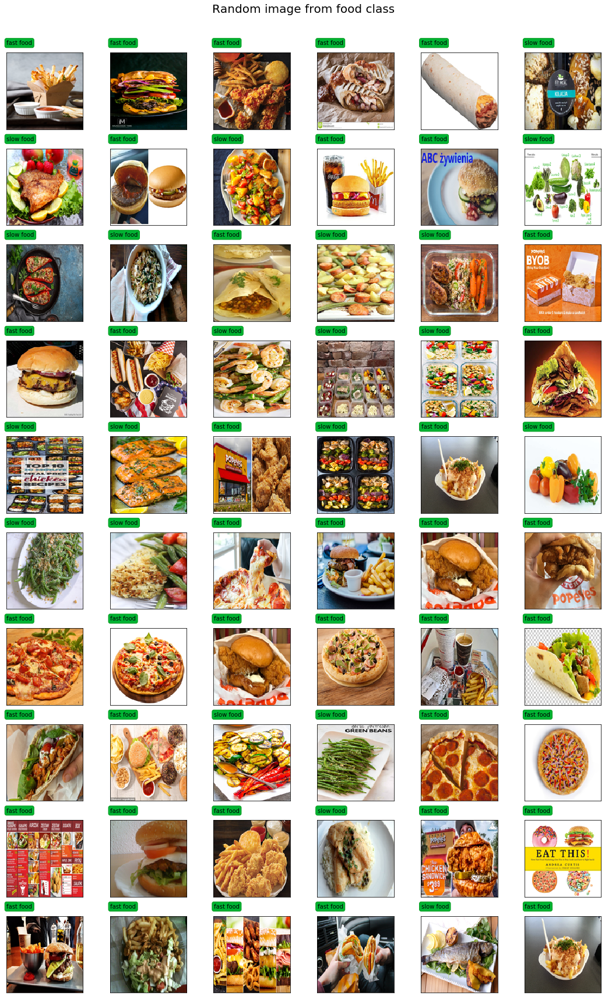

In [11]:
root_listdir = [i for i in root_listdir if i != 0]
list_of_images_indices = np.random.choice(len(root_listdir), 60)
fig, ax = plt.subplots(10, 6, frameon=False, figsize=(15, 25))
fig.suptitle('Random image from food class', fontsize=20)

row = 0
col = 0

ec = (0, .6, .1)
fc = (0, .7, .2)
for i in list_of_images_indices:
    try:
        image = Image.open(root_dir + '/' + root_listdir[i])
        image = image.resize((120, 120), Image.ANTIALIAS)
        class_name = root_listdir[i].split('.')[1].replace('_', ' ')
        ax[row][col].imshow(image)
        ax[row][col].text(0, -20, class_name, size=10, rotation=0, ha='left',
                         va='top', bbox=dict(boxstyle='round', ec=ec, fc=fc))
        
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

        col += 1
        if col % 6 == 0 and col*row != 54:
            col = 0
            row += 1
        elif col*row == 54:
            break
    except (OSError, ValueError) as e:
        print(e)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

Splitting images into train, test and valid sets.

In [12]:
import shutil

len_data = len(root_listdir)
train_set = 0.8
train_examples = round(len_data*train_set)
valid_examples = round((len_data - train_examples)*0.2)
test_examples = len_data - train_examples - valid_examples

labels = np.asarray([1 if 'fast_food' in i else 0 for i in root_listdir])

# randomly choose training and testing cases
permutation = np.random.permutation(len_data)
train_set = [root_listdir[i] for i in permutation[:][:train_examples]]
test_set = [root_listdir[i] for i in permutation[train_examples:-valid_examples]]
valid_set = [root_listdir[i] for i in permutation[-valid_examples:]]


train_labels = labels[permutation[:train_examples]]
test_labels = labels[permutation[train_examples:-valid_examples]]
valid_labels = labels[permutation[-valid_examples:]]

train_folder = root_dir + '/train'
test_folder = root_dir + '/test'
valid_folder = root_dir + '/valid'

    
os.makedirs(train_folder+'/fast_food/')
os.makedirs(train_folder+'/slow_food/')
os.makedirs(test_folder+'/fast_food/')
os.makedirs(test_folder+'/slow_food/')
os.makedirs(valid_folder+'/fast_food/')
os.makedirs(valid_folder+'/slow_food/')

for f,i in zip(train_set, train_labels):
    if i==0:
        shutil.move(root_dir + '/' + f, train_folder+'/slow_food/')
    else:
        shutil.move(root_dir + '/' + f, train_folder+'/fast_food/')

for f,i in zip(test_set, test_labels):
    if i==0:
        shutil.move(root_dir + '/' + f, test_folder+'/slow_food/')
    else:
        shutil.move(root_dir +  '/' + f, test_folder+'/fast_food/')

for f,i in zip(valid_set, valid_labels):
    if i==0:
        shutil.move(root_dir + '/' + f, valid_folder+'/slow_food/')
    else:
        shutil.move(root_dir +  '/' + f, valid_folder+'/fast_food/')


# Classification models

In [13]:
import numpy as np
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
import matplotlib.image as img
import random
import itertools

from PIL import Image
from sklearn.metrics import confusion_matrix

from keras.preprocessing.image import ImageDataGenerator
from keras import applications, backend as K
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Conv2D, MaxPool2D, Flatten, BatchNormalization, Dropout
from keras.layers.core import Dense, Flatten
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import *
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy

%matplotlib inline

In [14]:
channels = 3
batch_size = 32

## Functions 

In [15]:
def plot_accuracy_loss(history):
    """
    Function plotting:
    :accuracy and validation accuracy on firs plot
    :loss and validation loss on second plot
    """
    fig = plt.figure(figsize=(10,5))
 
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.ylim([0, 1])
 
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()

In [16]:
def plot_predictions(filenames, preds):
    """
    Method plotting test set with predictions.
    :param preds - list of predictions for test set.
    :param filenames - list of filenames in test set.
    """
    root_listdir = filenames[:60]
    preds = preds[:60]

    fig, ax = plt.subplots(10, 6, frameon=False, figsize=(15, 25))
    fig.suptitle('Predictions from test set', fontsize=20)

    row = 0
    col = 0
    
    wrong_prediction_filenames = []
    ec = (0, .6, .1)
    for i in range(len(root_listdir)):
        try:
            if 'slow_food' in  root_listdir[int(i)]:
                last_dir = 'slow_food'
                class_number = 0
            else:
                last_dir = 'fast_food'
                class_number = 1

            if preds[i] == 0:
                class_name = 'slow food'
            else:
                class_name = 'fast food'

            image = Image.open(root_dir + '/test/' + last_dir + '/' + root_listdir[int(i)])
            image = image.resize((120, 120), Image.ANTIALIAS)
            ax[row][col].imshow(image)

            if class_number != preds[i]:
                fc = (1, .0, .0)
                wrong_prediction_filenames.append(root_listdir[int(i)])
            else:
                fc = (0, .7, .2)

            ax[row][col].text(0, -20, class_name, size=10, rotation=0, ha='left',
                             va='top', bbox=dict(boxstyle='round', ec=ec, fc=fc))

            ax[row][col].set_xticks([])
            ax[row][col].set_yticks([])

            col += 1
            if col % 6 == 0 and col*row != 54:
                col = 0
                row += 1
            elif col*row == 54:
                break
        except (OSError, ValueError) as e:
            print(e)
    return wrong_prediction_filenames


In [17]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting 'normalize=True'
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print('Normalized confusion matrix')
    else:
        print('Confusion matrix, without normalization')
    print(cm)
    
    tresh = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(round(j, 2), round(i, 2), round(cm[i, j], 2), horizontalalignment='center', color='white' if cm[i, j] > tresh else 'black')
    
    ax = plt.gca()  # only to illustrate what `ax` is
    ax.autoscale(enable=True, axis='y', tight=False)
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## Logistic regression

First attempt should be simple so we will check Logistic Regression on our data.

In [18]:
img_height = img_width = 224
batch_size = 32
channels = 3

In [19]:
train_generator = ImageDataGenerator(rescale=1./255,
                                     rotation_range=5,
                                     zoom_range=0.2, 
                                     horizontal_flip=True).flow_from_directory(
    train_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

test_generator = ImageDataGenerator(rescale=1./255,
                                    rotation_range=5,
                                    zoom_range=0.2,
                                    horizontal_flip=True).flow_from_directory(
    train_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

x_train, y_train = next(train_generator)
x_test, y_test = next(test_generator)

Found 1362 images belonging to 2 classes.
Found 1362 images belonging to 2 classes.


In [20]:
from sklearn.linear_model import LogisticRegression
logistic = LogisticRegression(solver='liblinear')
logistic.fit(x_train.reshape(batch_size,-1), y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [21]:
y_pred = logistic.predict(x_test.reshape(len(x_test), -1))
y_pred[:10]

array([0., 1., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32)

In [22]:
logistic.predict_proba(x_test[:3].reshape(3,-1))

array([[9.35844574e-01, 6.41554257e-02],
       [4.87977419e-02, 9.51202258e-01],
       [9.99938578e-01, 6.14215270e-05]])

In [23]:
np.count_nonzero(y_pred == y_test)/len(y_test)

0.6875

Model accuracy is not satisfactory.

## Build Fine-tuned VGG16 model

Now we will try to use pretrained model VGG16. The model achieves 92.7% top-5 test accuracy in ImageNet, which is a dataset of over 14 million images belonging to 1000 classes. 

In [24]:
K.clear_session()

In [25]:
vgg16_model = applications.vgg16.VGG16()

In [26]:
vgg16_model = applications.vgg16.VGG16()

In [27]:
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [28]:
model = Sequential()
for layer in vgg16_model.layers:
    model.add(layer)

In [29]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

We should pop dense layers.

In [30]:
model.layers.pop()
model.layers.pop()
model.layers.pop()

In [31]:
for layer in model.layers:
    layer.trainable = False

In [32]:
model.add(Dense(2, activation='sigmoid'))

In [33]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [34]:
img_height = img_width = 224
batch_size = 32
channels = 3

train_batches = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    train_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=10,
    classes=['fast_food', 'slow_food'])

test_batches = ImageDataGenerator(rescale=1./255,
                                  rotation_range=5,
                                  zoom_range=0.2,
                                  horizontal_flip=True).flow_from_directory(
    test_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=10,
    classes=['fast_food', 'slow_food'],
    shuffle=False)

valid_batches = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    valid_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=4,
    classes=['fast_food', 'slow_food'])

Found 1362 images belonging to 2 classes.
Found 272 images belonging to 2 classes.
Found 68 images belonging to 2 classes.


## Train the fine-tuned VGG16 model 


In [35]:
model.compile(Adam(lr=.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [36]:
history = model.fit_generator(train_batches, train_examples//10, validation_data=valid_batches, validation_steps= valid_examples//4 + 1, epochs=4, verbose=2)

Epoch 1/4


C:\Users\Milosz\AppData\Local\Programs\Python\Python36\lib\site-packages\PIL\TiffImagePlugin.py:802: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


 - 253s - loss: 0.6927 - accuracy: 0.5459 - val_loss: 0.6956 - val_accuracy: 0.5694
Epoch 2/4
 - 251s - loss: 0.6916 - accuracy: 0.6072 - val_loss: 0.6874 - val_accuracy: 0.5972
Epoch 3/4
 - 260s - loss: 0.6907 - accuracy: 0.5799 - val_loss: 0.6969 - val_accuracy: 0.5833
Epoch 4/4
 - 257s - loss: 0.6896 - accuracy: 0.6457 - val_loss: 0.6961 - val_accuracy: 0.6250


In [37]:
predictions = model.predict_generator(test_batches, test_examples//10)

In [38]:
correct = 0
for i, f in enumerate(test_batches.filenames[:len(predictions)]):
    if 'slow_food' in f and predictions[i][0]<0.5:
        correct +=1
    if 'fast_food' in f and predictions[i][0]>=0.5:
        correct +=1

print('Correct predictions: '+str(correct/len(test_batches.filenames)))

Correct predictions: 0.6433823529411765


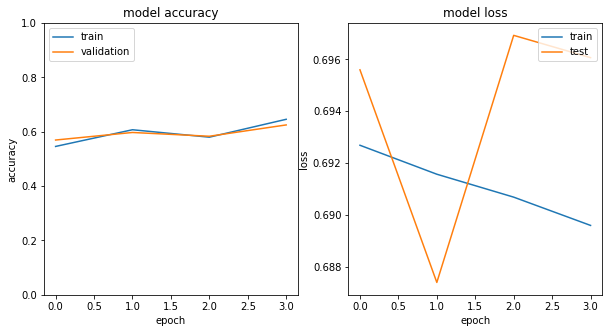

In [39]:
plot_accuracy_loss(history)

In [40]:
c = list(zip([i.split('\\')[1] for i in test_batches.filenames],[1 if i[0] >= 0.5 else 0 for i in predictions]))
my_list = random.shuffle(c)

filenames, preds = zip(*c)

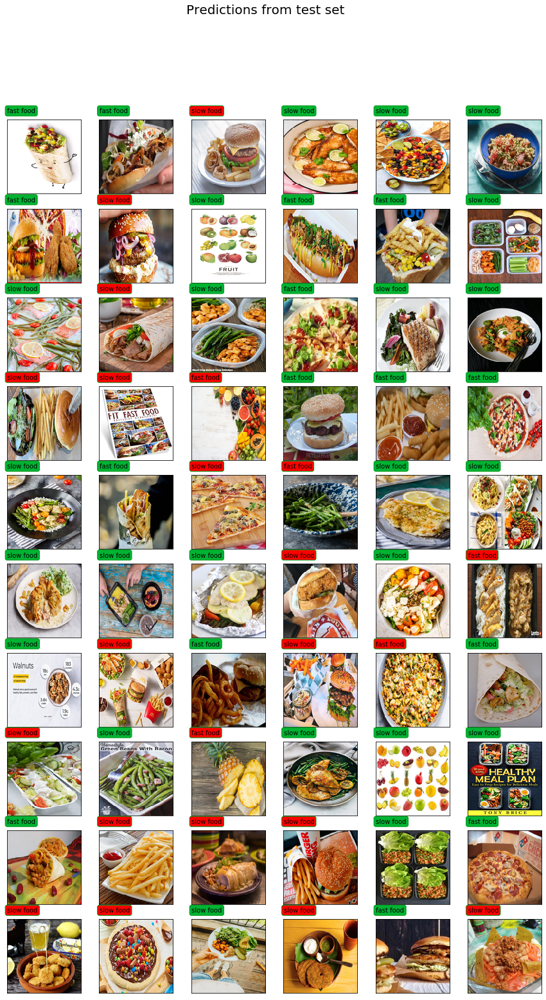

In [41]:
wrong_predictions = plot_predictions(filenames, preds)

In [42]:
wrong_predictions

['85.fast_food.jpg',
 '310.fast_food.jpg',
 '414.fast_food.jpg',
 '173.fast_food.jpeg',
 '286.fast_food.jpg',
 '372.slow_food.jpg',
 '499.fast_food.jpg',
 '835.slow_food.jpg',
 '723.fast_food.jpg',
 '552.slow_food.jpg',
 '69.fast_food.jpeg',
 '86.fast_food.jpg',
 '273.slow_food.jpg',
 '487.fast_food.jpg',
 '448.slow_food.jpg',
 '594.fast_food.jpg',
 '821.fast_food.jpg',
 '7.fast_food.jpeg',
 '203.fast_food.jpg',
 '538.fast_food.jpg',
 '277.fast_food.jpg',
 '833.fast_food.jpg']

In [43]:
test_labels = np.array([0 if 'slow_food' in f else 1 for f in test_batches.filenames])[:len(predictions)]
cm = confusion_matrix(test_labels, np.round(predictions[:,0]))

Confusion matrix, without normalization
[[112  31]
 [ 64  63]]


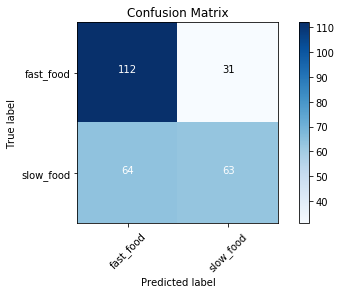

In [44]:
cm_plot_labels = ['fast_food', 'slow_food']
plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix')

Model performed better than simple guessing, but it is still less accurate than Logistic Regression.

# Sequential model

Pretrained model didn't pass the exam. Now we will try create our own model.

In [45]:
K.clear_session()

In [46]:
model = Sequential()

model.add(Conv2D(8, kernel_size=(3,3), padding='same', input_shape = (img_width,img_height,channels)))
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(16, kernel_size=(3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(32, kernel_size=(3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(2, activation='sigmoid'))
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [47]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 8)       224       
_________________________________________________________________
activation_1 (Activation)    (None, 224, 224, 8)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 8)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 16)      1168      
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 16)      64        
_________________________________________________________________
activation_2 (Activation)    (None, 112, 112, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 16)       

In [48]:
train_batches= ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    train_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    classes=['fast_food', 'slow_food'])

test_batches = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    test_folder,
    color_mode = "rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    classes=['fast_food', 'slow_food'],
    shuffle=False)


Found 1362 images belonging to 2 classes.
Found 272 images belonging to 2 classes.


In [49]:
model.fit_generator(train_batches, train_examples//batch_size, epochs=2)

Epoch 1/2
38/42 [==========================>...] - ETA: 1:04 - loss: 0.7926 - accuracy: 0.53 - ETA: 52s - loss: 7.4288 - accuracy: 0.5312 - ETA: 54s - loss: 7.8656 - accuracy: 0.520 - ETA: 48s - loss: 8.2194 - accuracy: 0.539 - ETA: 49s - loss: 6.7679 - accuracy: 0.562 - ETA: 47s - loss: 6.5959 - accuracy: 0.552 - ETA: 42s - loss: 6.2878 - accuracy: 0.550 - ETA: 41s - loss: 6.1506 - accuracy: 0.547 - ETA: 38s - loss: 5.5757 - accuracy: 0.574 - ETA: 37s - loss: 5.1357 - accuracy: 0.585 - ETA: 36s - loss: 4.9928 - accuracy: 0.579 - ETA: 35s - loss: 4.9174 - accuracy: 0.574 - ETA: 34s - loss: 4.6965 - accuracy: 0.579 - ETA: 32s - loss: 4.4852 - accuracy: 0.584 - ETA: 30s - loss: 4.3719 - accuracy: 0.580 - ETA: 29s - loss: 4.3035 - accuracy: 0.581 - ETA: 28s - loss: 4.2384 - accuracy: 0.585 - ETA: 26s - loss: 4.0515 - accuracy: 0.597 - ETA: 25s - loss: 3.8817 - accuracy: 0.605 - ETA: 24s - loss: 3.8600 - accuracy: 0.600 - ETA: 24s - loss: 3.7900 - accuracy: 0.604 - ETA: 22s - loss: 3.6788 

C:\Users\Milosz\AppData\Local\Programs\Python\Python36\lib\site-packages\PIL\TiffImagePlugin.py:802: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


42/42 [==============================] - ETA: 3s - loss: 2.9844 - accuracy: 0.63 - ETA: 2s - loss: 2.9405 - accuracy: 0.63 - ETA: 1s - loss: 2.8769 - accuracy: 0.63 - 47s 1s/step - loss: 2.8413 - accuracy: 0.6391
Epoch 2/2
42/42 [==============================] - ETA: 39s - loss: 0.8608 - accuracy: 0.750 - ETA: 37s - loss: 0.8732 - accuracy: 0.773 - ETA: 37s - loss: 0.9998 - accuracy: 0.729 - ETA: 37s - loss: 1.5711 - accuracy: 0.675 - ETA: 38s - loss: 1.7916 - accuracy: 0.659 - ETA: 36s - loss: 1.7025 - accuracy: 0.679 - ETA: 38s - loss: 1.6737 - accuracy: 0.685 - ETA: 37s - loss: 1.5826 - accuracy: 0.693 - ETA: 36s - loss: 1.5848 - accuracy: 0.694 - ETA: 35s - loss: 1.4962 - accuracy: 0.700 - ETA: 34s - loss: 1.4744 - accuracy: 0.696 - ETA: 34s - loss: 1.4472 - accuracy: 0.695 - ETA: 33s - loss: 1.4220 - accuracy: 0.697 - ETA: 32s - loss: 1.3983 - accuracy: 0.697 - ETA: 31s - loss: 1.4317 - accuracy: 0.692 - ETA: 29s - loss: 1.5246 - accuracy: 0.683 - ETA: 28s - loss: 1.6604 - accura

In [50]:
y_pred = model.predict_generator(test_batches, test_examples//batch_size, workers=4)

In [51]:
correct = 0
for i, f in enumerate(test_batches.filenames[:len(y_pred)]):
    if 'slow_food' in f and y_pred[i][0]<0.5:
        correct +=1
    if 'fast_food' in f and y_pred[i][0]>=0.5:
        correct +=1

print('Correct predictions: '+str(correct/len(test_batches.filenames)))

Correct predictions: 0.5220588235294118


In [52]:
c = list(zip([i.split('\\')[1] for i in test_batches.filenames],[1 if i[0] >= 0.5 else 0 for i in y_pred]))
my_list = random.shuffle(c)

filenames_2, preds_2 = zip(*c)

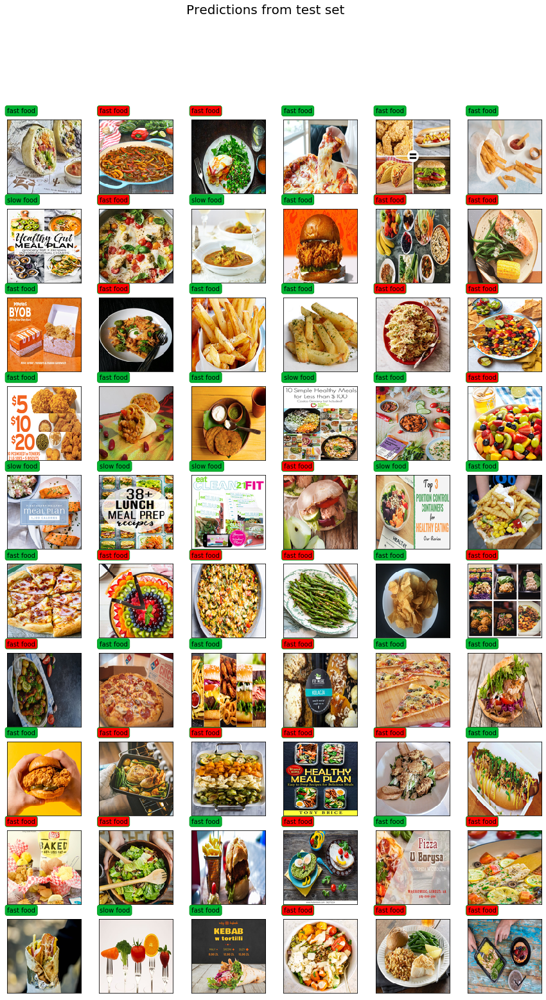

In [53]:
wrong_predictions_2 = plot_predictions(filenames_2, preds_2)

In [54]:
wrong_predictions_2

['294.slow_food.jpg',
 '27.slow_food.jpg',
 '717.slow_food.jpg',
 '203.slow_food.jpg',
 '52.slow_food.jpg',
 '597.slow_food.jpg',
 '585.slow_food.jpg',
 '486.slow_food.jpg',
 '447.slow_food.jpg',
 '183.slow_food.jpg',
 '411.slow_food.jpg',
 '273.slow_food.jpg',
 '778.slow_food.jpg',
 '542.slow_food.jpg',
 '555.slow_food.jpg',
 '538.slow_food.jpg',
 '199.slow_food.jpg',
 '365.slow_food.jpg',
 '111.slow_food.jpg',
 '581.slow_food.jpg',
 '765.slow_food.jpg',
 '242.slow_food.jpg',
 '256.slow_food.jpg',
 '704.slow_food.jpg',
 '338.slow_food.jpg',
 '684.slow_food.jpg',
 '159.slow_food.jpg']

In [55]:
test_labels = np.array([0 if 'slow_food' in f else 1 for f in test_batches.filenames])[:len(y_pred)]
cm = confusion_matrix(test_labels, np.round(y_pred[:, 0]))

Confusion matrix, without normalization
[[ 27 102]
 [ 12 115]]


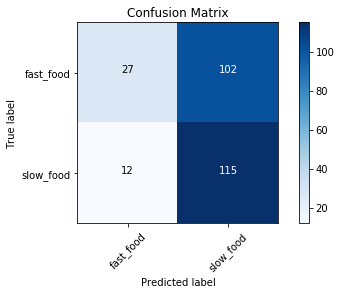

In [56]:
cm_plot_labels = ['fast_food', 'slow_food']
plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix')

Model is much worse than previous ones. It means that simple model won't be enough, because we don't have big dataset.

## Transfer learning

Last attempt is transfer learning. We will use VGG16 again but this time in other way.

In [57]:
K.clear_session()

In [58]:
model = applications.VGG16(include_top=False, input_shape=(img_width, img_height, channels))

In [59]:
batch_size = 32
img_height = img_width = 224
channels = 3

train_batches_1 = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    train_folder,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode=None,
    shuffle=False)

train_batches_2 = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    train_folder,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode=None,
    shuffle=False)

test_batches = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    test_folder,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False)

valid_batches = ImageDataGenerator(rescale=1./255,
                                   rotation_range=5,
                                   zoom_range=0.2,
                                   horizontal_flip=True).flow_from_directory(
    valid_folder,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode=None,
    shuffle=False)


Found 1362 images belonging to 2 classes.
Found 1362 images belonging to 2 classes.
Found 272 images belonging to 2 classes.
Found 68 images belonging to 2 classes.


In [60]:
model = applications.VGG16(include_top=False, weights='imagenet')
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

Training VGG16 on our data should give us the bottleneks of our images. In this case we will use VGG16 predictions to train our sequential model. It means that we changed sets of images into sets of bottlenecks which could be more helpful in detecting category.

In [61]:
bottleneck_features_train = model.predict_generator(train_batches_1, train_examples//batch_size, verbose=1, workers=4)
bottleneck_features_valid = model.predict_generator(valid_batches, test_examples//batch_size, verbose=1, workers=4)
bottleneck_features_test = model.predict_generator(test_batches, test_examples//batch_size, verbose=1, workers=4)

bottleneck_features_train.shape

8/8 [==============================] - ETA: 57 - ETA: 42 - ETA: 32 - ETA: 25 - ETA: 19 - ETA: 12 - ETA: 6 - 49s 6s/step


(1344, 7, 7, 512)

In [62]:
model = Sequential()
model.add(Flatten(input_shape=bottleneck_features_train.shape[1:]))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop',
              loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               6422784   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 6,423,041
Trainable params: 6,423,041
Non-trainable params: 0
_________________________________________________________________


In [63]:
labels = np.array([0 if 'slow_food' in f else 1 for f in train_batches_2.filenames])[:len(bottleneck_features_train)]
val_labels = np.array([0 if 'slow_food' in f else 1 for f in valid_batches.filenames])[:len(bottleneck_features_valid)]

history_2 = model.fit(bottleneck_features_train, labels, validation_data=(bottleneck_features_valid[:len(val_labels)], val_labels), epochs=20, batch_size=batch_size)

Train on 1344 samples, validate on 68 samples
Epoch 1/20
1344/1344 [==============================] - ETA: 6s - loss: 1.0893 - accuracy: 0.40 - ETA: 4s - loss: 10.2667 - accuracy: 0.484 - ETA: 3s - loss: 9.2927 - accuracy: 0.500 - ETA: 3s - loss: 8.9889 - accuracy: 0.50 - ETA: 3s - loss: 7.9174 - accuracy: 0.53 - ETA: 2s - loss: 7.1078 - accuracy: 0.52 - ETA: 2s - loss: 6.5790 - accuracy: 0.52 - ETA: 2s - loss: 6.1400 - accuracy: 0.50 - ETA: 2s - loss: 6.5108 - accuracy: 0.49 - ETA: 2s - loss: 6.1595 - accuracy: 0.50 - ETA: 2s - loss: 5.7594 - accuracy: 0.50 - ETA: 2s - loss: 5.4467 - accuracy: 0.52 - ETA: 1s - loss: 5.1517 - accuracy: 0.52 - ETA: 1s - loss: 4.9737 - accuracy: 0.52 - ETA: 1s - loss: 4.8826 - accuracy: 0.52 - ETA: 1s - loss: 4.7472 - accuracy: 0.52 - ETA: 1s - loss: 4.6414 - accuracy: 0.52 - ETA: 1s - loss: 4.5635 - accuracy: 0.52 - ETA: 1s - loss: 4.4513 - accuracy: 0.52 - ETA: 1s - loss: 4.2711 - accuracy: 0.53 - ETA: 1s - loss: 4.1265 - accuracy: 0.53 - ETA: 1s - los

1344/1344 [==============================] - ETA: 2s - loss: 0.5969 - accuracy: 0.65 - ETA: 2s - loss: 0.6168 - accuracy: 0.68 - ETA: 2s - loss: 0.5043 - accuracy: 0.76 - ETA: 2s - loss: 0.4368 - accuracy: 0.78 - ETA: 2s - loss: 0.4489 - accuracy: 0.78 - ETA: 2s - loss: 0.4544 - accuracy: 0.77 - ETA: 2s - loss: 0.4292 - accuracy: 0.78 - ETA: 2s - loss: 0.4115 - accuracy: 0.79 - ETA: 2s - loss: 0.3957 - accuracy: 0.81 - ETA: 2s - loss: 0.3791 - accuracy: 0.82 - ETA: 1s - loss: 0.3684 - accuracy: 0.83 - ETA: 1s - loss: 0.3687 - accuracy: 0.83 - ETA: 1s - loss: 0.3732 - accuracy: 0.82 - ETA: 1s - loss: 0.3661 - accuracy: 0.83 - ETA: 1s - loss: 0.3492 - accuracy: 0.84 - ETA: 1s - loss: 0.3485 - accuracy: 0.83 - ETA: 1s - loss: 0.3515 - accuracy: 0.83 - ETA: 1s - loss: 0.3872 - accuracy: 0.83 - ETA: 1s - loss: 0.3974 - accuracy: 0.83 - ETA: 1s - loss: 0.3898 - accuracy: 0.83 - ETA: 1s - loss: 0.3860 - accuracy: 0.83 - ETA: 1s - loss: 0.3868 - accuracy: 0.83 - ETA: 1s - loss: 0.3903 - accura

1344/1344 [==============================] - ETA: 2s - loss: 0.0709 - accuracy: 1.00 - ETA: 2s - loss: 0.0625 - accuracy: 1.00 - ETA: 2s - loss: 0.0657 - accuracy: 0.98 - ETA: 2s - loss: 0.0942 - accuracy: 0.98 - ETA: 2s - loss: 0.0986 - accuracy: 0.97 - ETA: 2s - loss: 0.1012 - accuracy: 0.96 - ETA: 2s - loss: 0.0982 - accuracy: 0.96 - ETA: 2s - loss: 0.0982 - accuracy: 0.96 - ETA: 2s - loss: 0.1025 - accuracy: 0.96 - ETA: 1s - loss: 0.1234 - accuracy: 0.95 - ETA: 1s - loss: 0.1492 - accuracy: 0.95 - ETA: 1s - loss: 0.1542 - accuracy: 0.95 - ETA: 1s - loss: 0.1840 - accuracy: 0.93 - ETA: 1s - loss: 0.1918 - accuracy: 0.93 - ETA: 1s - loss: 0.1909 - accuracy: 0.93 - ETA: 1s - loss: 0.2006 - accuracy: 0.92 - ETA: 1s - loss: 0.1982 - accuracy: 0.92 - ETA: 1s - loss: 0.1896 - accuracy: 0.92 - ETA: 1s - loss: 0.1911 - accuracy: 0.92 - ETA: 1s - loss: 0.1863 - accuracy: 0.92 - ETA: 1s - loss: 0.1879 - accuracy: 0.92 - ETA: 1s - loss: 0.1859 - accuracy: 0.92 - ETA: 1s - loss: 0.1855 - accura

1344/1344 [==============================] - ETA: 2s - loss: 0.0250 - accuracy: 1.00 - ETA: 2s - loss: 0.0431 - accuracy: 1.00 - ETA: 2s - loss: 0.0489 - accuracy: 0.98 - ETA: 2s - loss: 0.0530 - accuracy: 0.98 - ETA: 2s - loss: 0.0567 - accuracy: 0.98 - ETA: 2s - loss: 0.0575 - accuracy: 0.97 - ETA: 2s - loss: 0.0537 - accuracy: 0.98 - ETA: 2s - loss: 0.0601 - accuracy: 0.97 - ETA: 1s - loss: 0.0548 - accuracy: 0.97 - ETA: 1s - loss: 0.0615 - accuracy: 0.97 - ETA: 1s - loss: 0.0710 - accuracy: 0.97 - ETA: 1s - loss: 0.0708 - accuracy: 0.97 - ETA: 1s - loss: 0.0730 - accuracy: 0.97 - ETA: 1s - loss: 0.0804 - accuracy: 0.96 - ETA: 1s - loss: 0.1220 - accuracy: 0.95 - ETA: 1s - loss: 0.1736 - accuracy: 0.92 - ETA: 1s - loss: 0.1874 - accuracy: 0.92 - ETA: 1s - loss: 0.1800 - accuracy: 0.92 - ETA: 1s - loss: 0.1733 - accuracy: 0.92 - ETA: 1s - loss: 0.1708 - accuracy: 0.92 - ETA: 1s - loss: 0.1641 - accuracy: 0.93 - ETA: 1s - loss: 0.1637 - accuracy: 0.93 - ETA: 1s - loss: 0.1585 - accura

1344/1344 [==============================] - ETA: 2s - loss: 0.0133 - accuracy: 1.00 - ETA: 2s - loss: 0.0125 - accuracy: 1.00 - ETA: 2s - loss: 0.0213 - accuracy: 0.98 - ETA: 2s - loss: 0.1117 - accuracy: 0.95 - ETA: 2s - loss: 0.1797 - accuracy: 0.93 - ETA: 2s - loss: 0.1670 - accuracy: 0.93 - ETA: 2s - loss: 0.1639 - accuracy: 0.94 - ETA: 2s - loss: 0.1533 - accuracy: 0.94 - ETA: 2s - loss: 0.1402 - accuracy: 0.94 - ETA: 2s - loss: 0.1266 - accuracy: 0.95 - ETA: 1s - loss: 0.1197 - accuracy: 0.95 - ETA: 1s - loss: 0.1135 - accuracy: 0.95 - ETA: 1s - loss: 0.1070 - accuracy: 0.96 - ETA: 1s - loss: 0.1000 - accuracy: 0.96 - ETA: 1s - loss: 0.0941 - accuracy: 0.96 - ETA: 1s - loss: 0.0905 - accuracy: 0.96 - ETA: 1s - loss: 0.0860 - accuracy: 0.97 - ETA: 1s - loss: 0.0882 - accuracy: 0.97 - ETA: 1s - loss: 0.0887 - accuracy: 0.96 - ETA: 1s - loss: 0.0949 - accuracy: 0.96 - ETA: 1s - loss: 0.1000 - accuracy: 0.96 - ETA: 1s - loss: 0.1009 - accuracy: 0.96 - ETA: 1s - loss: 0.0984 - accura

In [64]:
test_labels = np.array([0 if 'slow_food' in f else 1 for f in test_batches.filenames])[:len(bottleneck_features_test)]
y_test_pred = model.predict_classes(bottleneck_features_test)
accuracy = np.count_nonzero(y_test_pred[:len(test_labels)].ravel() == test_labels)/len(test_labels)

print('\nThe accuracy is: '+str(accuracy))


The accuracy is: 0.8125


In [65]:
correct = 0
for i, f in enumerate(test_batches.filenames[:len(test_labels)]):
    if 'slow_food' in f and y_test_pred[i] == 0:
        correct +=1
    if 'fast_food' in f and y_test_pred[i] == 1:
        correct +=1

print('Correct predictions: '+str(correct/len(test_batches.filenames[:len(test_labels)])))

Correct predictions: 0.8125


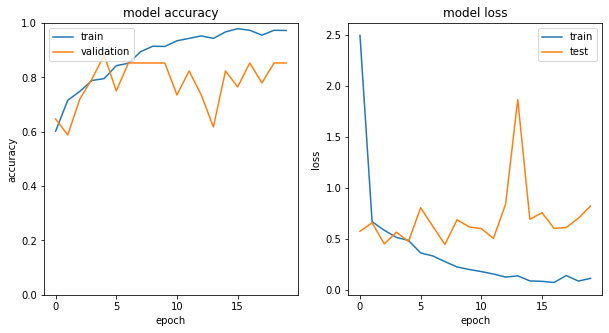

In [66]:
plot_accuracy_loss(history_2)

This model is the most promising one.

In [67]:
cm = confusion_matrix(test_labels, np.round(y_test_pred[:len(test_labels)]))
cm_plot_labels = ['slow_food', 'fast_food']

Confusion matrix, without normalization
[[117  12]
 [ 36  91]]


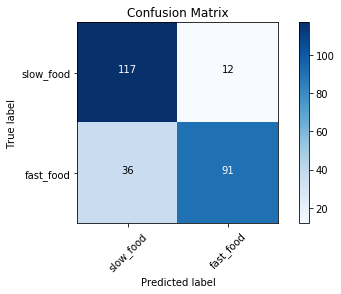

In [68]:
plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix')

Normalized confusion matrix
[[0.90697674 0.09302326]
 [0.28346457 0.71653543]]


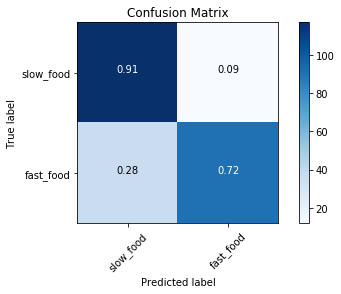

In [69]:
plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix', normalize=True)

Prediction on the test set are also much more accurate thane previous ones.

In [70]:
c = list(zip([i.split('\\')[1] for i in test_batches.filenames], y_test_pred))
my_list = random.shuffle(c)

filenames_3, preds_3 = zip(*c)

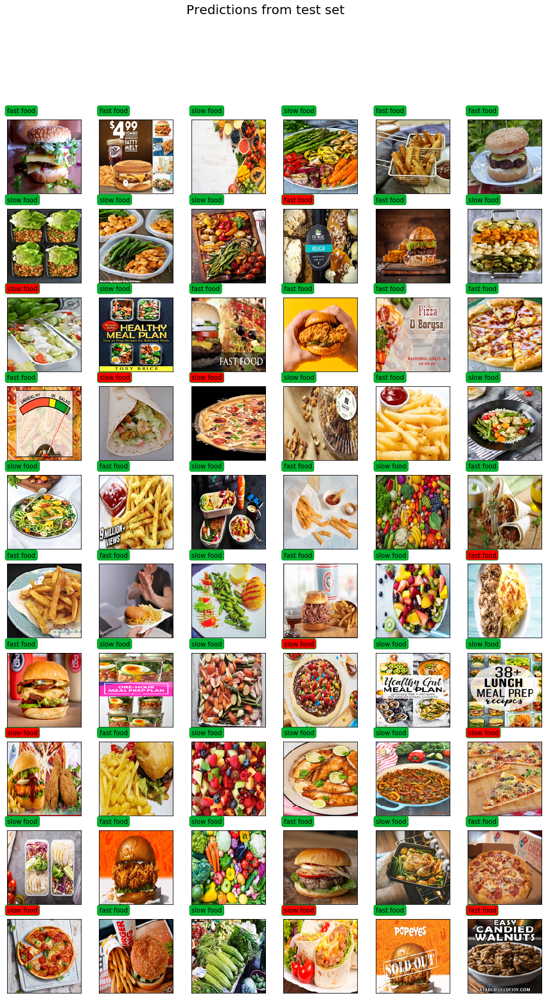

In [71]:
wrong_predictions_3 = plot_predictions(filenames_3, preds_3)

In [72]:
wrong_predictions_3

['538.slow_food.jpg',
 '487.fast_food.jpg',
 '405.fast_food.jpg',
 '531.fast_food.jpg',
 '557.slow_food.jpg',
 '538.fast_food.jpg',
 '296.fast_food.jpg',
 '499.fast_food.jpg',
 '502.fast_food.jpg',
 '845.fast_food.jpg',
 '600.slow_food.jpg']